In [13]:
#2019-07 to 2021-06

In [1]:
#pip install --upgrade netCDF4

In [1]:
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import numpy as np
#import xarray as xr
#import xesmf as xe
import netCDF4
from netCDF4 import Dataset
import sys
import pandas as pd

### Load Regional Mask

In [2]:
mask = np.load('data/SIC_data/NSIDC_25km_Arctic_Ocean_regional_landmask.npy')

In [3]:
cond1 = mask > 3
cond2 = mask < 6
cond3 = mask > 5
cond4 = mask < 8
el_mask = np.where(cond1 & cond2, 1, 0)
bk_mask = np.where(cond3 & cond4, 1, 0)
print(el_mask.shape, bk_mask.shape)

(448, 304) (448, 304)


In [4]:
dx = dy = 25000

x = np.arange(-3850000, +3750000, +dx)
y = np.arange(+5850000, -5350000, -dy)

x.shape, y.shape

((304,), (448,))

Text(0.5, 1.0, 'Arctic SIC Regions without Land Mask')

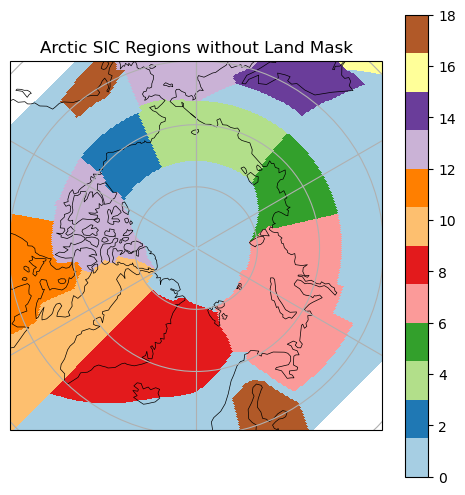

In [9]:
#Arctic Subregions without Land Mask
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, mask, cmap=plt.cm.Paired,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Arctic SIC Regions without Land Mask")

Text(0.5, 1.0, 'Arctic SIC Regions with Land Mask')

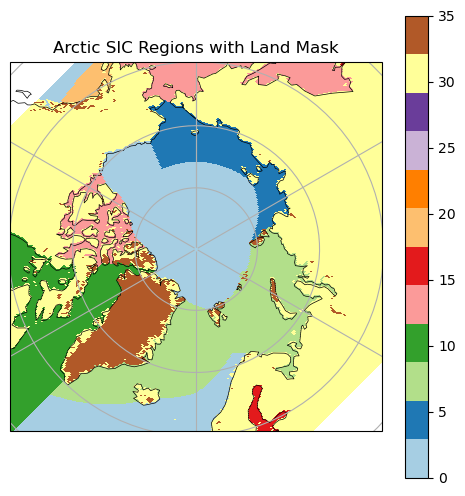

In [6]:
#Arctic Subregions with Land Mask
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, mask, cmap=plt.cm.Paired,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Arctic SIC Regions with Land Mask")

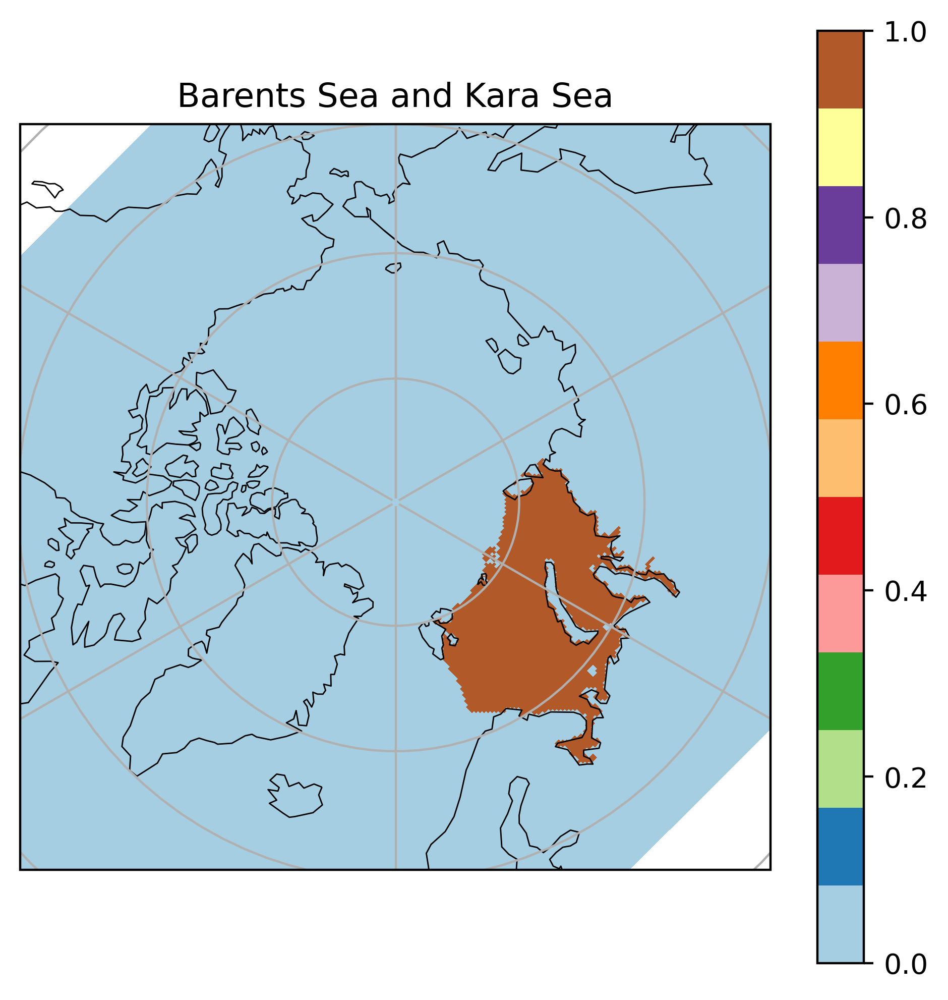

In [22]:
#Barents Sea and Kara Sea
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6), dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, bk_mask, cmap=plt.cm.Paired,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Barents Sea and Kara Sea")
plt.savefig('BK_sea.png')

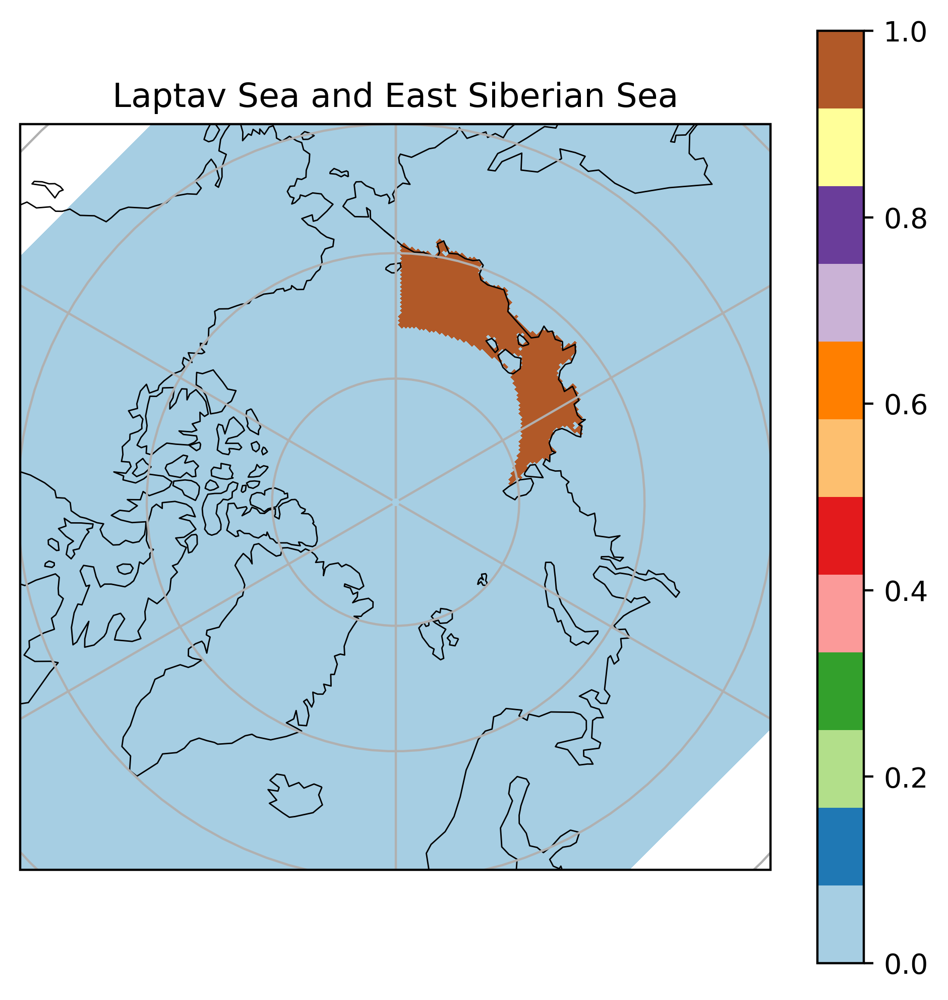

In [23]:
#Laptav Sea and East Siberian Sea
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6), dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, el_mask, cmap=plt.cm.Paired,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Laptav Sea and East Siberian Sea")
plt.savefig('EL_sea.png')

### Load SST for Barents and Kara Sea

In [8]:
whole_data = np.load("data/SIC_data/whole_data.npy")
lw = whole_data[:,:,:,-5]

In [10]:
#region_mask = np.load("data/NSIDC_25km_Arctic_Ocean_regional_mask.npy")
print(mask.shape)
m_region_mask = np.tile(mask, (510, 1, 1)) #turn mask into time-series
print(m_region_mask.shape)
#region_mask = np.where(region_mask )

(448, 304)
(510, 448, 304)


In [43]:
#idx = np.where((m_region_mask >= 6) & (m_region_mask <= 7))
#sst[idx] = 0

In [16]:
dx = dy = 25000

x = np.arange(-3850000, +3750000, +dx)
y = np.arange(+5850000, -5350000, -dy)

x.shape, y.shape

((304,), (448,))

Text(0.5, 1.0, 'LWDN for Jan 1979')

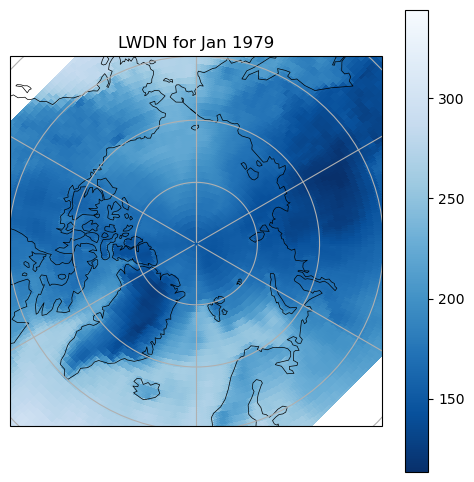

In [13]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, lw[0], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("LWDN for Jan 1979")

### Load Pan-Arctic Data

In [4]:
land_mask = np.load("data/SIC_data/y_land_mask_actual.npy",allow_pickle=True)
y_land_mask = land_mask.reshape(1, 448, 304)

### Summer Preds for LW -> SIC

In [5]:
ice = np.load("data/stcinet_test_lw_sic_lag1_v2.npy",allow_pickle=True)
pred_cf1 = np.load("data/stcinet_predcf_lw_sic_lag1_v2.npy",allow_pickle=True)


real_ice = np.multiply(ice, y_land_mask)
#pred = np.multiply(pred, y_land_mask)
pred_cf1 = np.multiply(pred_cf1, y_land_mask)


In [6]:
#Summer Preds for LW -> SIC
print(real_ice.shape, pred_cf1.shape)

(508, 448, 304) (508, 448, 304)


In [7]:
june = real_ice[4::12,:,:]
july = real_ice[5::12,:,:]
aug = real_ice[6::12,:,:]
print(june.shape)
print(july.shape)
print(aug.shape)
summer_real = np.concatenate((june.reshape(42, 448, 304,1),july.reshape(42, 448, 304,1),aug.reshape(42, 448, 304,1)),3)
print(summer_real.shape)
summer_real = np.mean(summer_real, axis=3)
print(summer_real.shape)
#summer_real = summer_real.flatten()

(42, 448, 304)
(42, 448, 304)
(42, 448, 304)
(42, 448, 304, 3)
(42, 448, 304)


In [8]:
june = pred_cf1[4::12,:,:]
july = pred_cf1[5::12,:,:]
aug = pred_cf1[6::12,:,:]
print(june.shape)
print(july.shape)
print(aug.shape)
summer_cf = np.concatenate((june.reshape(42, 448, 304,1),july.reshape(42, 448, 304,1),aug.reshape(42, 448, 304,1)),3)
print(summer_cf.shape)
summer_cf = np.mean(summer_cf, axis=3)
print(summer_cf.shape)

(42, 448, 304)
(42, 448, 304)
(42, 448, 304)
(42, 448, 304, 3)
(42, 448, 304)


In [9]:
summer_diff = summer_cf - summer_real
summer_diff = np.multiply(summer_diff,y_land_mask)
print(summer_diff.shape)

(42, 448, 304)


In [10]:
#Spatial Mean of all years
summer_real_42 = np.mean(summer_real[:,:,:],axis=0)
print(summer_real_42.shape)
summer_real_1990 = summer_real[11,:,:]
summer_real_2003 = summer_real[24,:,:]

(448, 304)


In [11]:
#Spatial Mean of last 20 years
summer_diff_20 = np.mean(summer_diff[-22:,:,:],axis=0)
print(summer_diff_20.shape)

(448, 304)


In [12]:
#Spatial Mean of all years
summer_diff_42 = np.mean(summer_diff[:,:,:],axis=0)
print(summer_diff_42.shape)

(448, 304)


Text(0.5, 1.0, 'Mean SIC (JJA) 1979-2021')

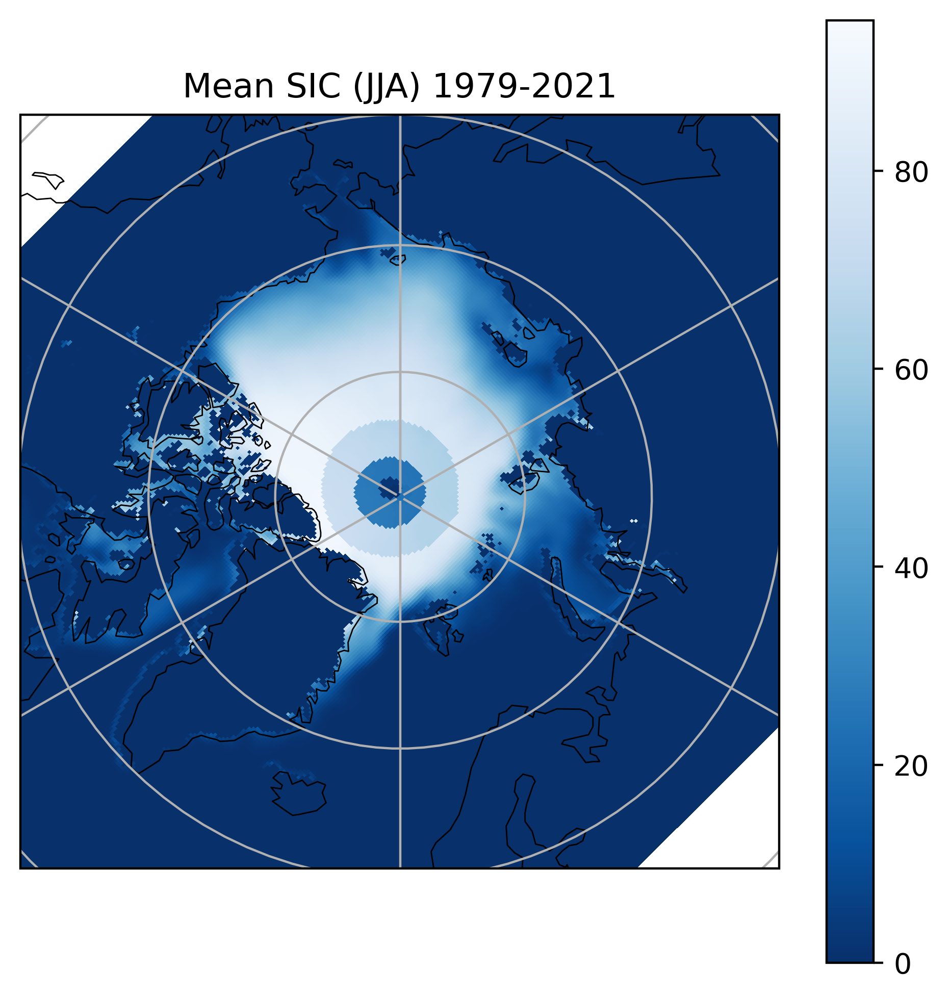

In [73]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(6, 6),dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, summer_real_42, cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Mean SIC (JJA) 1979-2021")

Text(0.5, 1.0, 'Mean SIC (JJA) Diff 1979-2021')

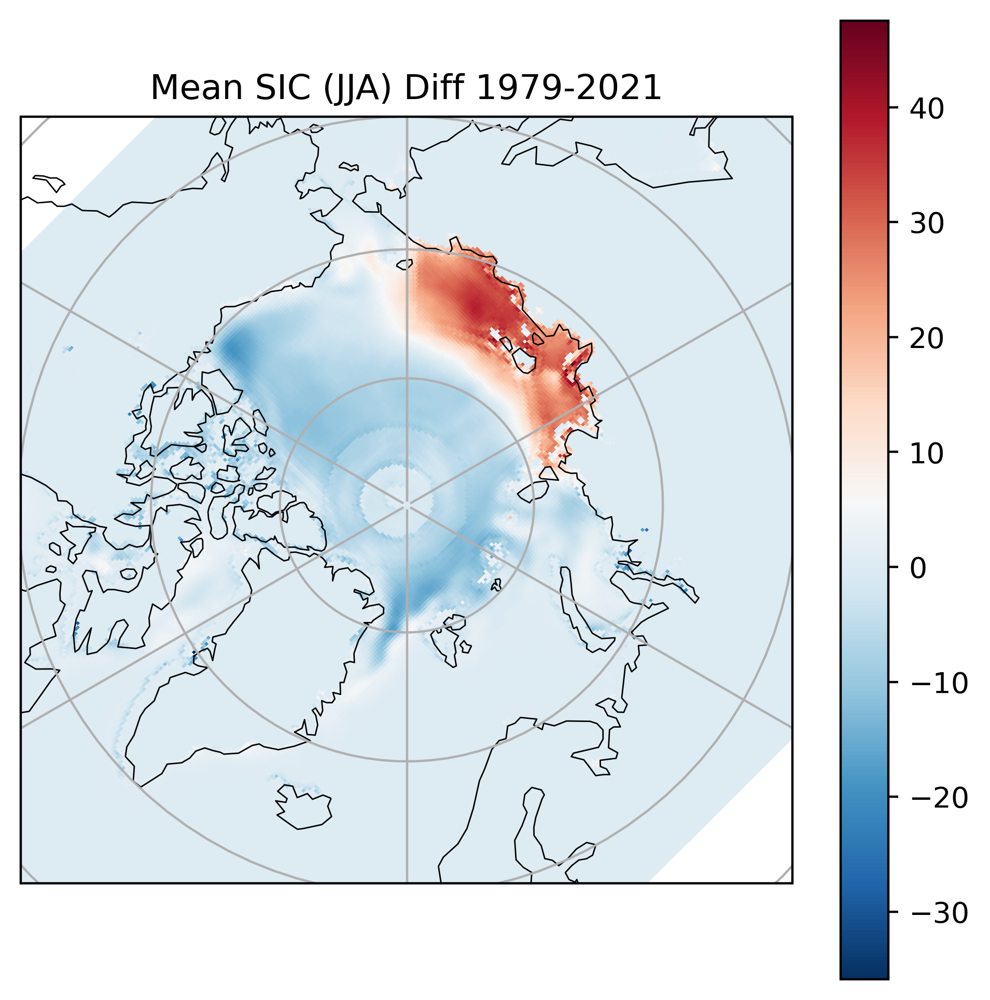

In [68]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(6, 6),dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, summer_diff_42, cmap='RdBu_r',
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Mean SIC (JJA) Diff 1979-2021")

In [13]:
# JJA of specific years
summer_diff_1990 = summer_diff[11,:,:]
summer_diff_2012 = summer_diff[33,:,:]
summer_diff_2003 = summer_diff[24,:,:]

In [14]:
np.mean(summer_diff_1990), np.mean(summer_diff_2003)

(-0.14128049777501897, 0.28912694981342674)

Text(0.5, 1.0, 'Mean SIC (JJA) Diff 1990')

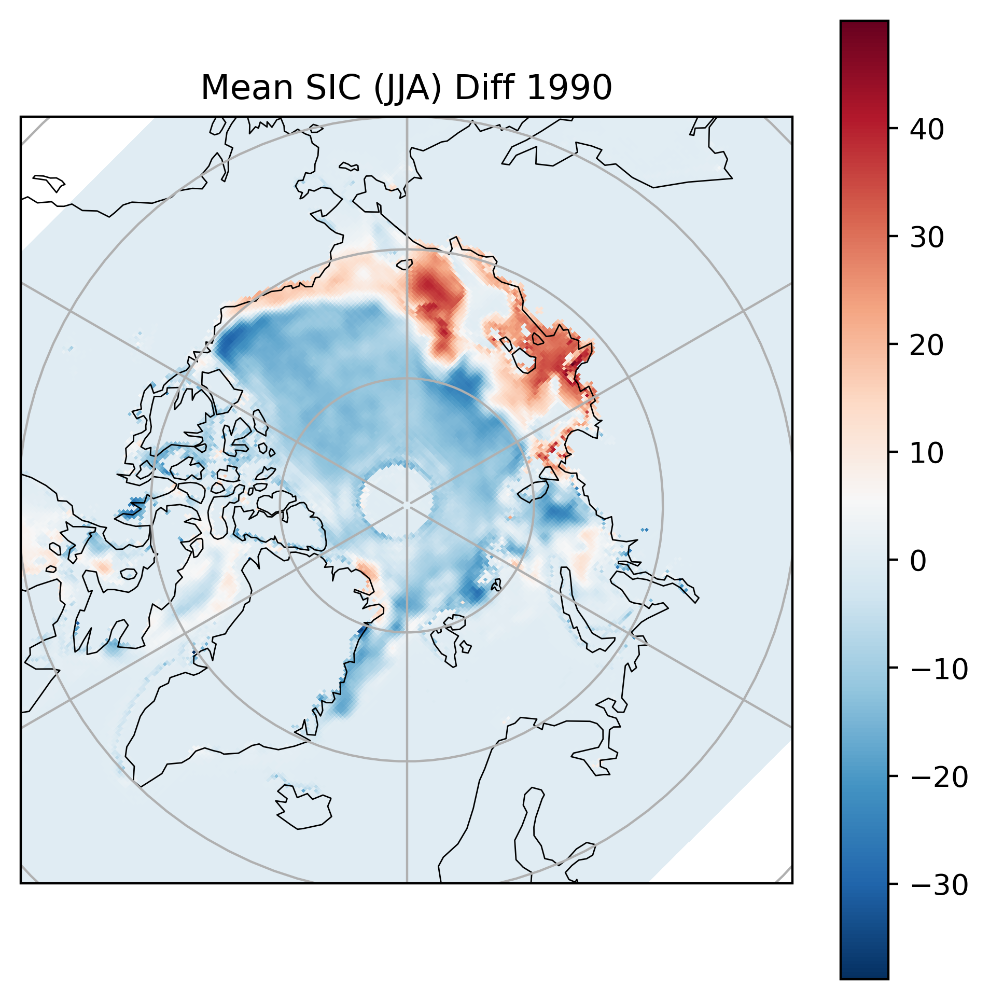

In [66]:
fig = plt.figure(figsize=(6, 6),dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, summer_diff_1990, cmap='RdBu_r',
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Mean SIC (JJA) Diff 1990")

Text(0.5, 1.0, 'Mean SIC (JJA) Diff 2012')

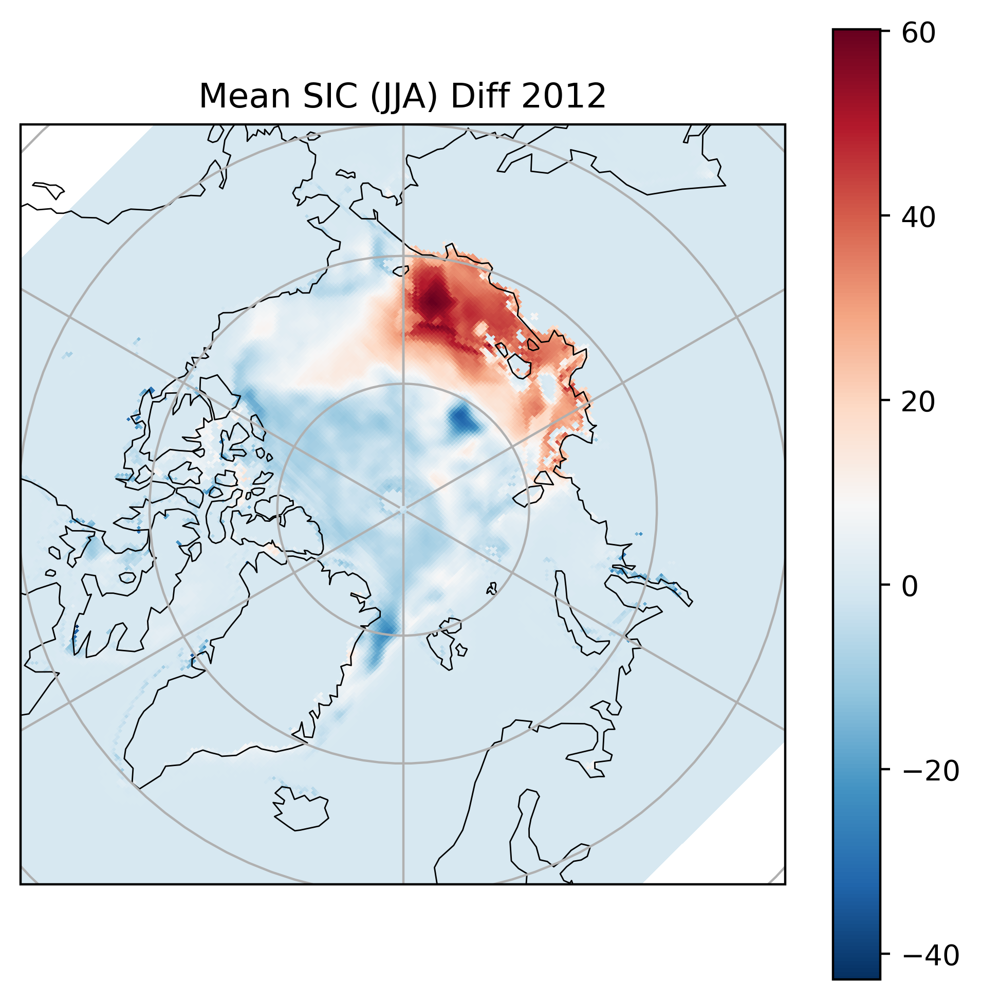

In [97]:
fig = plt.figure(figsize=(6, 6),dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, summer_diff_2012, cmap='RdBu_r',
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Mean SIC (JJA) Diff 2012")

### Winter Preds for SIC -> SLP

In [52]:
slp = np.load("data/stcinet_test_sic_slp_lag1.npy",allow_pickle=True)
pred_cf = np.load("data/stcinet_predcf_sic_slp_lag1.npy",allow_pickle=True)


real_slp = np.multiply(slp, y_land_mask)
#pred = np.multiply(pred, y_land_mask)
pred_cf = np.multiply(pred_cf, y_land_mask)

In [57]:
dec = real_slp[7::12,:,:]
jan = real_slp[8::12,:,:]
feb = real_slp[9::12,:,:]
print(dec.shape)
print(jan.shape)
print(feb.shape)
winter_real = np.concatenate((dec.reshape(42, 448, 304,1),jan.reshape(42, 448, 304,1),feb.reshape(42, 448, 304,1)),3)
print(winter_real.shape)
winter_real = np.mean(winter_real, axis=3)
print(winter_real.shape)

(42, 448, 304)
(42, 448, 304)
(42, 448, 304)
(42, 448, 304, 3)
(42, 448, 304)


In [58]:
dec = pred_cf[7::12,:,:]
jan = pred_cf[8::12,:,:]
feb = pred_cf[9::12,:,:]
print(dec.shape)
print(jan.shape)
print(feb.shape)
winter_cf = np.concatenate((dec.reshape(42, 448, 304,1),jan.reshape(42, 448, 304,1),feb.reshape(42, 448, 304,1)),3)
print(winter_cf.shape)
winter_cf = np.mean(winter_cf, axis=3)
print(winter_cf.shape)

(42, 448, 304)
(42, 448, 304)
(42, 448, 304)
(42, 448, 304, 3)
(42, 448, 304)


In [59]:
winter_diff = winter_cf - winter_real
winter_diff = np.multiply(winter_diff,y_land_mask)
print(winter_diff.shape)

(42, 448, 304)


In [76]:
#Spatial Mean of all years
winter_real_42 = np.mean(winter_real[:,:,:],axis=0)
print(winter_real_42.shape)

(448, 304)


In [74]:
#Spatial Mean of last 20 years
winter_diff_20 = np.mean(winter_diff[-22:,:,:],axis=0)
print(winter_diff_20.shape)

(448, 304)


In [60]:
#Spatial Mean of all years
winter_diff_42 = np.mean(winter_diff[:,:,:],axis=0)
print(winter_diff_42.shape)

(448, 304)


Text(0.5, 1.0, 'Mean SLP (DJF) 1979-2021')

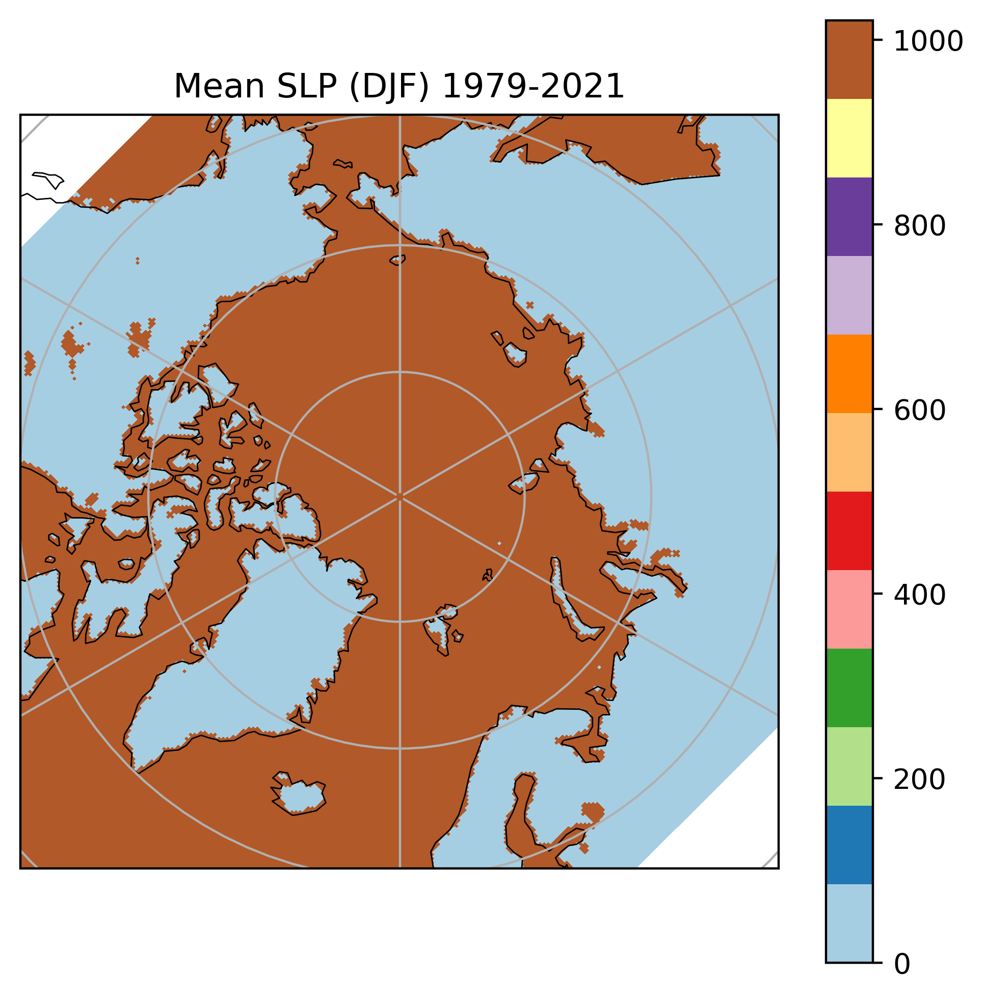

In [79]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(6, 6),dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, winter_real_42, cmap=plt.cm.Paired,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Mean SLP (DJF) 1979-2021")

Text(0.5, 1.0, 'Mean SLP (DJF) Diff 1979-2021')

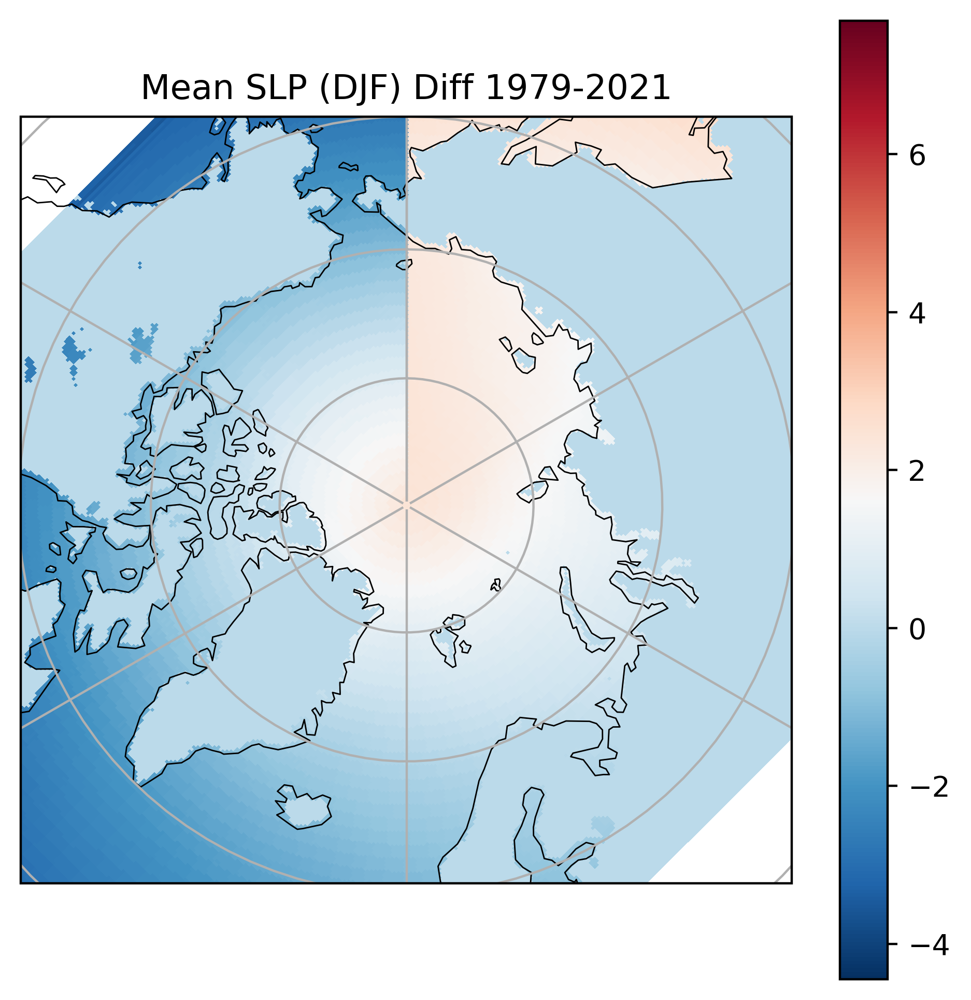

In [80]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(6, 6),dpi=400)
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, winter_diff_42, cmap='RdBu_r',
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Mean SLP (DJF) Diff 1979-2021")

### Time-Series Analysis


In [26]:
ts = pred.shape[0]
real_ts = np.array([np.mean(ice[i,:,:]) for i in range(ts)])
pred_ts = np.array([np.mean(pred[i,:,:]) for i in range(ts)])
cf_ts = np.array([np.mean(pred_cf1[i,:,:]) for i in range(ts)])
print(real_ts.shape)

(508,)


Text(0, 0.5, 'Outcome(Y)')

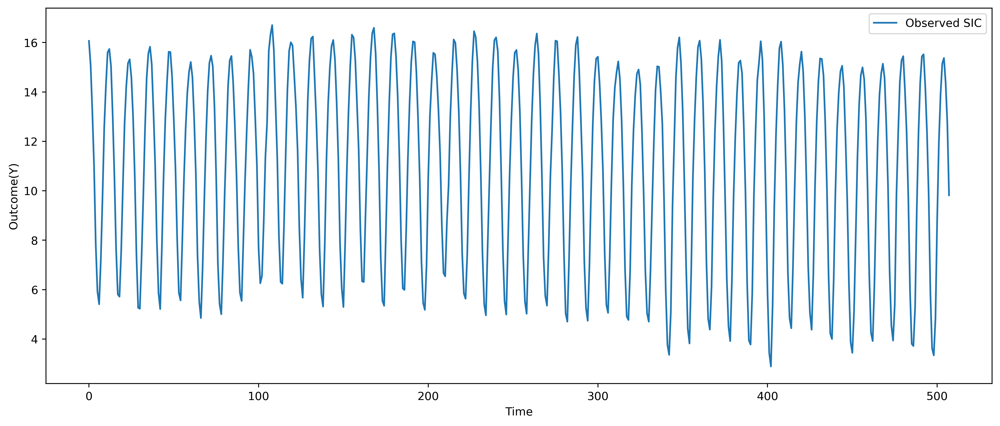

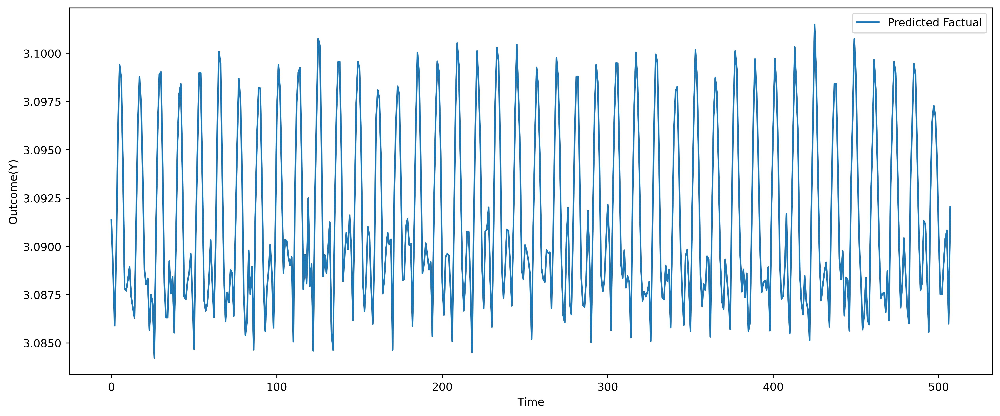

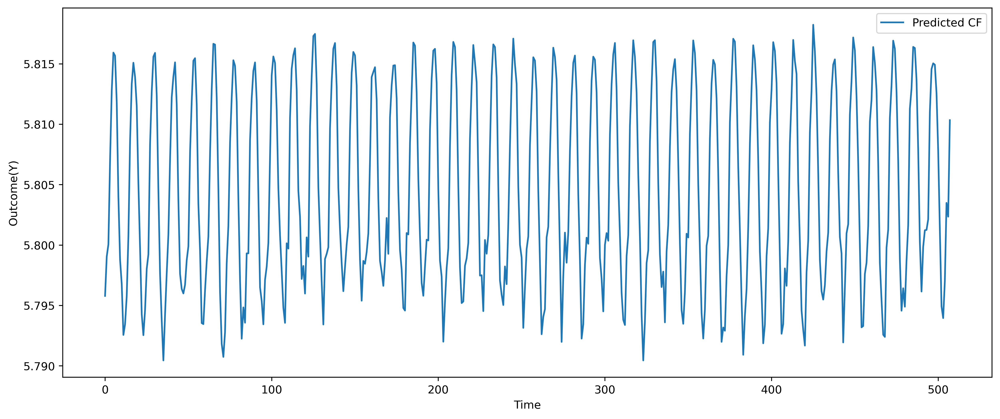

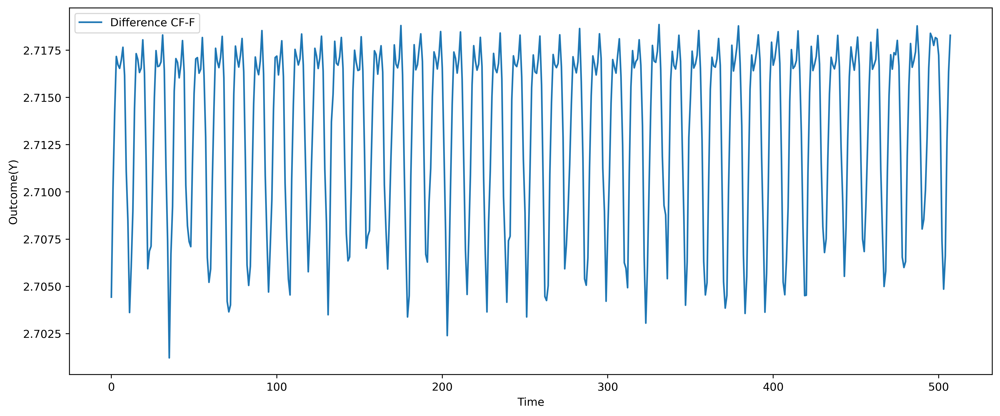

In [36]:
fig,ax = plt.subplots(figsize = [15,6], dpi = 400)
#ax.plot(range(ts),cf_ts, label = "Predicted CF")
ax.plot(range(ts),real_ts, label = "Observed SIC")
#ax.plot(range(ts),pred_ts, label = "Predicted Factual")
ax.legend()
ax.set_xlabel("Time")
ax.set_ylabel(r"Outcome(Y)")

fig,ax = plt.subplots(figsize = [15,6], dpi = 400)
#ax.plot(range(ts),cf_ts, label = "Predicted CF")
#ax.plot(range(ts),real_ts, label = "Observed SIC")
ax.plot(range(ts),pred_ts, label = "Predicted Factual")
ax.legend()
ax.set_xlabel("Time")
ax.set_ylabel(r"Outcome(Y)")

fig,ax = plt.subplots(figsize = [15,6], dpi = 400)
ax.plot(range(ts),cf_ts, label = "Predicted CF")
#ax.plot(range(ts),real_ts, label = "Observed SIC")
#ax.plot(range(ts),pred_ts, label = "Predicted Factual")
ax.legend()
ax.set_xlabel("Time")
ax.set_ylabel(r"Outcome(Y)")

fig,ax = plt.subplots(figsize = [15,6], dpi = 400)
ax.plot(range(ts),cf_ts - pred_ts, label = "Difference CF-F")
#ax.plot(range(ts),real_ts, label = "Observed SIC")
#ax.plot(range(ts),pred_ts, label = "Predicted Factual")
ax.legend()
ax.set_xlabel("Time")
ax.set_ylabel(r"Outcome(Y)")

In [35]:
#fig,ax = plt.subplots(figsize = [15,6], dpi = 400)
#ax.plot(range(ts),cf_ts, label = "Predicted CF")
#ax.plot(range(ts),real_ts, label = "Observed SIC")
#ax.plot(range(ts),pred_ts, label = "Predicted Factual")
#ax.legend()
#ax.set_xlabel("Time")
#ax.set_ylabel(r"Outcome(Y)")

In [63]:
#Summer Months:

print(pred_ts.shape)
june = pred_ts[4::12]
july = pred_ts[5::12]
aug = pred_ts[6::12]
print(june.shape)
print(july.shape)
print(aug.shape)
summer_pred = np.concatenate((june.reshape(-1,1),july.reshape(-1,1),aug.reshape(-1,1)),1)

#print(summer_pred)
summer_pred = summer_pred.flatten()

(508,)
(42,)
(42,)
(42,)


In [64]:
print(cf_ts.shape)
june = cf_ts[4::12]
july = cf_ts[5::12]
aug = cf_ts[6::12]
print(june.shape)
print(july.shape)
print(aug.shape)
summer_cf = np.concatenate((june.reshape(-1,1),july.reshape(-1,1),aug.reshape(-1,1)),1)

#print(summer_pred)
summer_cf = summer_cf.flatten()

(508,)
(42,)
(42,)
(42,)


In [65]:
ate = np.mean(cf_ts - pred_ts)
print("Estimated ATE for all years:",ate)

summer_ate = np.mean(summer_cf - summer_pred)
print("Estimated ATE for JJA:",summer_ate)

Estimated ATE for all years: 2.7132796958671275
Estimated ATE for JJA: 2.716828674129284


### Spatial Analysis

In [ ]:
"""real_ice = np.multiply(ice, y_land_mask)
pred = np.multiply(pred, y_land_mask)
pred_cf = np.multiply(pred_cf, y_land_mask)
diff = np.multiply(diff, y_land_mask)
"""

In [98]:
summer_diff_2012.shape

(448, 304)

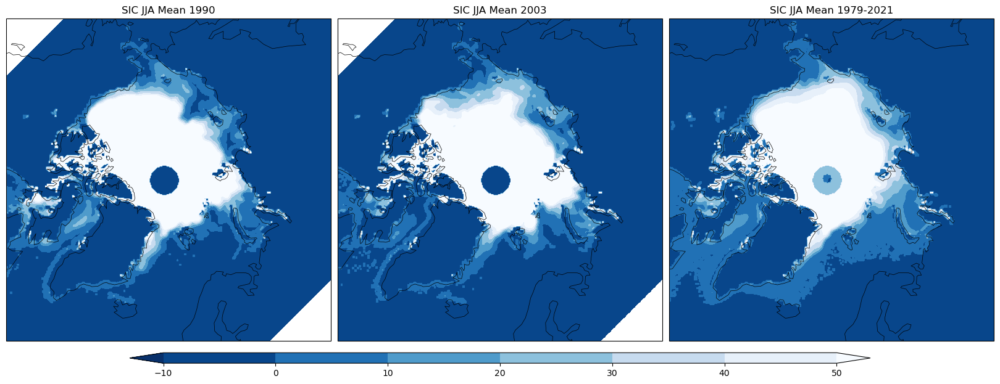

In [105]:
nrows=1
ncols=3

kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Define the contour levels to use in plt.contourf
clevs=np.arange(-10,60,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))

#------------
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())

# Contour plot
cs=axs[0].contourf(x, y, summer_real_1990,clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[0].set_title("SIC JJA Mean 1990")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, summer_real_2003, clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[1].set_title("SIC JJA Mean 2003")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, summer_real_42,clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[2].set_title("SIC JJA Mean 1979-2021")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()

#------------



# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.1, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')
#plt.savefig("Plots_ST_CF_Prediction",dpi=400)
# Add a big title at the top
plt.savefig("Plots_SIC_LW_Real_Plots",dpi=400)

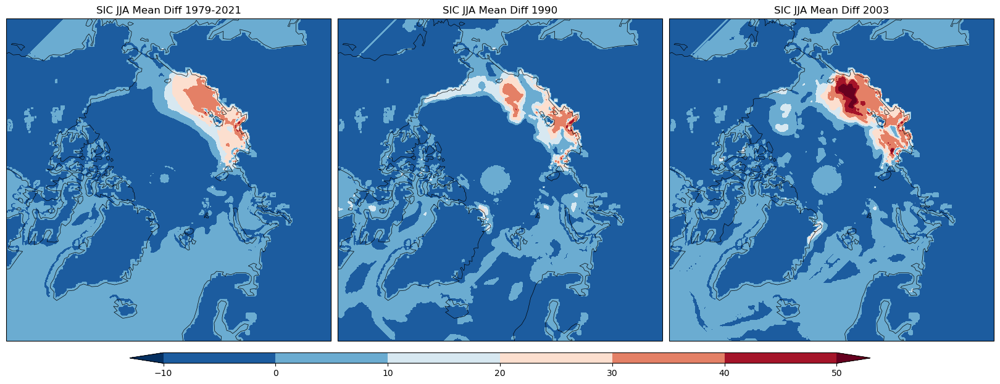

In [17]:
nrows=1
ncols=3

kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Define the contour levels to use in plt.contourf
clevs=np.arange(-10,60,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))

#------------
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())

# Contour plot
cs=axs[0].contourf(x, y, summer_diff_42,clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap='RdBu_r',extend='both')

# Title each subplot with the name of the model
axs[0].set_title("SIC JJA Mean Diff 1979-2021")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, summer_diff_1990, clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap='RdBu_r',extend='both')

# Title each subplot with the name of the model
axs[1].set_title("SIC JJA Mean Diff 1990")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, summer_diff_2003,clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap='RdBu_r',extend='both')

# Title each subplot with the name of the model
axs[2].set_title("SIC JJA Mean Diff 2003")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()

#------------



# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.1, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')
#plt.savefig("Plots_ST_CF_Prediction",dpi=400)
# Add a big title at the top
plt.savefig("Plots_SIC_LW_Diff_Plots",dpi=400)

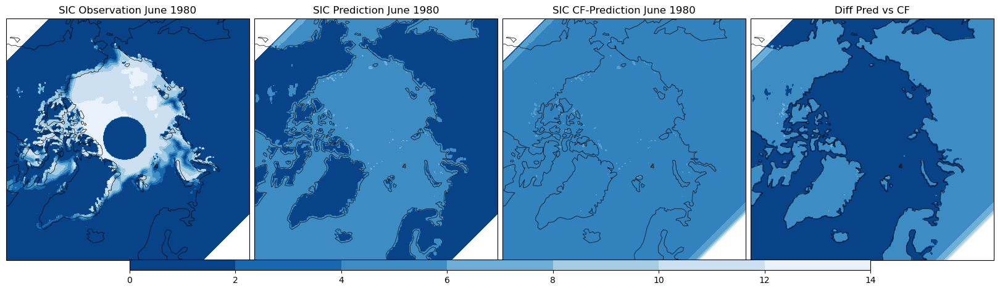

In [85]:
nrows=1
ncols=4

kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Define the contour levels to use in plt.contourf
clevs=np.arange(-10,100,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))

#------------
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())

# Contour plot
cs=axs[0].contourf(x, y, summer_diff_42,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r)

# Title each subplot with the name of the model
axs[0].set_title("SIC Observation June 1980")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, summer_diff_42,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r)

# Title each subplot with the name of the model
axs[1].set_title("SIC Prediction June 1980")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, summer_diff_42,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r)

# Title each subplot with the name of the model
axs[2].set_title("SIC CF-Prediction June 1980")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()

#------------
# Contour plot
axs[3].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[3].contourf(x, y, summer_diff_42,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r)

# Title each subplot with the name of the model
axs[3].set_title("Diff Pred vs CF")

# Draw the coastines for each subplot
axs[3].coastlines(resolution='110m', linewidth=0.5)

#-------------

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')
#plt.savefig("Plots_ST_CF_Diff_Prediction",dpi=400)

### Load Greenland Data

In [ ]:
grn = np.load()

In [16]:
real_ice = np.multiply(ice, y_land_mask)
pred = np.multiply(pred, y_land_mask)
pred_cf = np.multiply(pred_cf, y_land_mask)
diff = np.multiply(diff, y_land_mask)

In [9]:
dx = dy = 25000

x = np.arange(-3850000, +3750000, +dx)
y = np.arange(+5850000, -5350000, -dy)

x.shape, y.shape

((304,), (448,))

Text(0.5, 1.0, 'Feb 2014 Prediction')

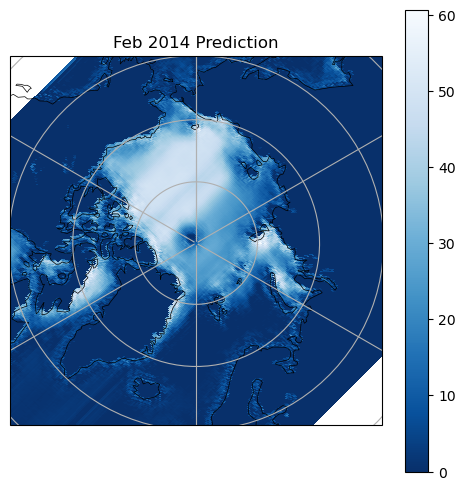

In [26]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, pred[0], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Feb 2014 Prediction")
#plt.savefig("Plots/Sept 2015 NSIDC Observation")
#cmap=plt.cm.Blues

Text(0.5, 1.0, 'Feb 2014 Diff Prediction')

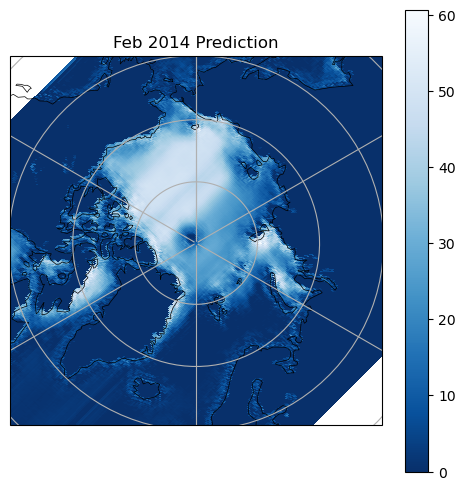

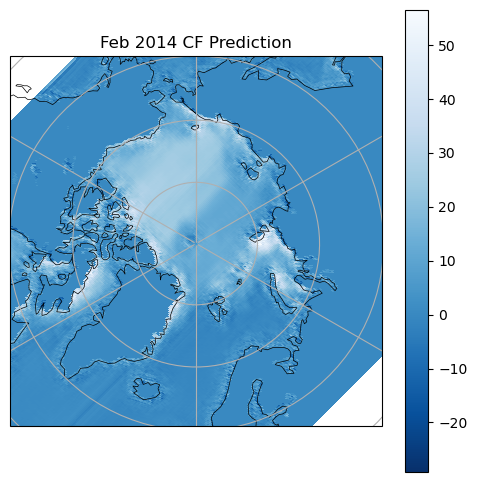

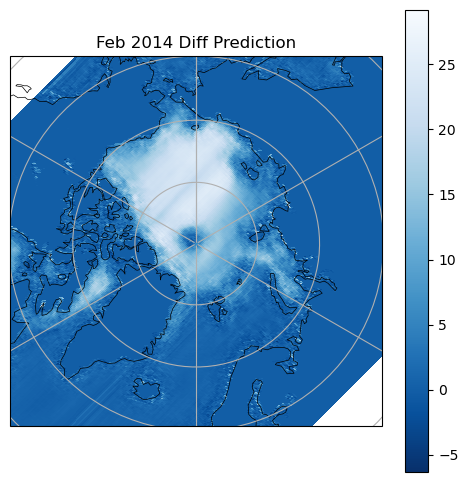

In [28]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, pred[0], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Feb 2014 Prediction")
#plt.savefig("Plots/Sept 2015 NSIDC Observation")
#cmap=plt.cm.Blues

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, pred_cf[0], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Feb 2014 CF Prediction")
#plt.savefig("Plots/Sept 2015 NSIDC Observation")
#cmap=plt.cm.Blues

fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, diff[0], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Feb 2014 Diff Prediction")

Text(0.5, 1.0, 'Feb 2014 Diff Prediction')

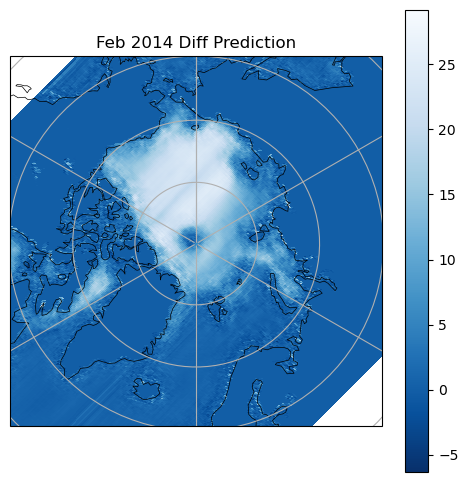

In [24]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, diff[0], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Feb 2014 Diff Prediction")

In [22]:
nrows=1
ncols=3

kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Define the contour levels to use in plt.contourf
clevs=np.arange(0,110,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))

#------------
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())

# Contour plot
cs=axs[0].contourf(x, y, pred[0],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[0].set_title("Feb 2014 SIC Prediction")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, pred_cf[0],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[1].set_title("Feb 2014 CF Prediction")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, diff[0],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[2].set_title("Feb 2014 Diff Prediction")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()




# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')
#plt.savefig("Plots/MT-IceNet 2020 Summer Prediction",dpi=400)

TypeError: 'MultiPolygon' object is not subscriptable

Error in callback <function _draw_all_if_interactive at 0x7f6ed60ff880> (for post_execute):


TypeError: 'MultiPolygon' object is not subscriptable

TypeError: 'MultiPolygon' object is not subscriptable

<Figure size 2000x850 with 3 Axes>

In [ ]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

#real_ice[0] == January 2014 
fig = plt.figure(figsize=(9, 9))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, pred[0], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Feb 2014 Prediction")
#plt.savefig("Plots/Sept 2015 NSIDC Observation")
#cmap=plt.cm.Blues

Text(0.5, 1.0, 'Sept 2020 SICNet Prediction')

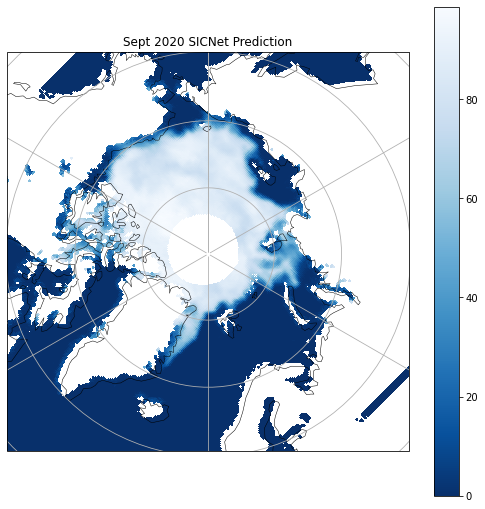

In [12]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(9, 9))
ax = plt.axes(projection=ccrs.NorthPolarStereo(central_longitude=0))
cs = ax.coastlines(resolution='110m', linewidth=0.5)
ax.gridlines()
ax.set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)
cs = ax.pcolormesh(x, y, ice[20], cmap=plt.cm.Blues_r,
                   transform=ccrs.Stereographic(**kw))
cbar = plt.colorbar(cs)
plt.title("Sept 2020 SICNet Prediction")
#plt.savefig("Plots/MT-IceNet Sept 2020 Prediction lag-1")
#cmap=plt.cm.Blues

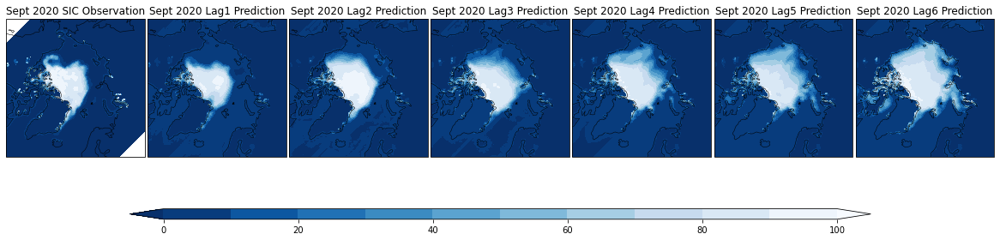

In [9]:
nrows=1
ncols=7

kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Define the contour levels to use in plt.contourf
clevs=np.arange(0,110,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))

#------------
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())

# Contour plot
cs=axs[0].contourf(x, y, real_ice[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[0].set_title("Sept 2020 SIC Observation")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, pred_ice1[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[1].set_title("Sept 2020 Lag1 Prediction")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, pred_ice2[79],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[2].set_title("Sept 2020 Lag2 Prediction")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()

#------------
# Contour plot
axs[3].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[3].contourf(x, y, pred_ice3[78],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[3].set_title("Sept 2020 Lag3 Prediction")

# Draw the coastines for each subplot
axs[3].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[4].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[4].contourf(x, y, pred_ice4[77],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[4].set_title("Sept 2020 Lag4 Prediction")

# Draw the coastines for each subplot
axs[4].coastlines(resolution='110m', linewidth=0.5)

#-------------

# Contour plot
axs[5].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[5].contourf(x, y, pred_ice5[76],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[5].set_title("Sept 2020 Lag5 Prediction")

# Draw the coastines for each subplot
axs[5].coastlines(resolution='110m', linewidth=0.5)
#-------------

# Contour plot
axs[6].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[6].contourf(x, y, pred_ice6[75],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[6].set_title("Sept 2020 Lag6 Prediction")

# Draw the coastines for each subplot
axs[6].coastlines(resolution='110m', linewidth=0.5)
#-------------

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')
plt.savefig("Plots/MT-IceNet 2020 Summer Prediction",dpi=400)
# Add a big title at the top
#plt.suptitle('2020 NSIDC Observations vs MT-IceNet Forecasts')

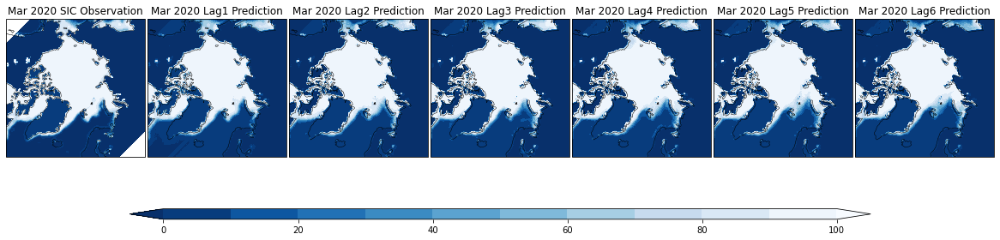

In [11]:
nrows=1
ncols=7


# Define the contour levels to use in plt.contourf
clevs=np.arange(0,110,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))

#------------
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())

# Contour plot
cs=axs[0].contourf(x, y, real_ice[74],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[0].set_title("Mar 2020 SIC Observation")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, pred_ice1[74],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[1].set_title("Mar 2020 Lag1 Prediction")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, pred_ice2[73],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[2].set_title("Mar 2020 Lag2 Prediction")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()

#------------
# Contour plot
axs[3].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[3].contourf(x, y, pred_ice3[72],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[3].set_title("Mar 2020 Lag3 Prediction")

# Draw the coastines for each subplot
axs[3].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[4].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[4].contourf(x, y, pred_ice4[71],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[4].set_title("Mar 2020 Lag4 Prediction")

# Draw the coastines for each subplot
axs[4].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[5].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[5].contourf(x, y, pred_ice5[70],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[5].set_title("Mar 2020 Lag5 Prediction")

# Draw the coastines for each subplot
axs[5].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[6].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[6].contourf(x, y, pred_ice6[69],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues_r,extend='both')

# Title each subplot with the name of the model
axs[6].set_title("Mar 2020 Lag6 Prediction")

# Draw the coastines for each subplot
axs[6].coastlines(resolution='110m', linewidth=0.5)

#-------------

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')
plt.savefig("Plots/MT-IceNet 2020 Winter Prediction",dpi=400)
# Add a big title at the top
#plt.suptitle('2020 NSIDC Observations vs MT-IceNet Forecasts')

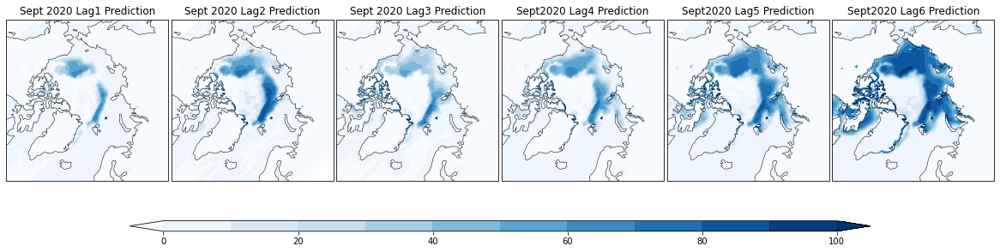

In [8]:
nrows=1
ncols=6

kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

# Define the contour levels to use in plt.contourf
clevs=np.arange(0,110,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))

#------------
# Contour plot
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[0].contourf(x, y, pred_ice1[79]-real_ice[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[0].set_title("Sept 2020 Lag1 Prediction")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, pred_ice2[78]-real_ice[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[1].set_title("Sept 2020 Lag2 Prediction")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()

#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, pred_ice3[77]-real_ice[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[2].set_title("Sept 2020 Lag3 Prediction")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[3].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[3].contourf(x, y, pred_ice4[76]-real_ice[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[3].set_title("Sept2020 Lag4 Prediction")

# Draw the coastines for each subplot
axs[3].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[4].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[4].contourf(x, y, pred_ice5[75]-real_ice[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[4].set_title("Sept2020 Lag5 Prediction")

# Draw the coastines for each subplot
axs[4].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[5].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[5].contourf(x, y, pred_ice6[74]-real_ice[80],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[5].set_title("Sept2020 Lag6 Prediction")

# Draw the coastines for each subplot
axs[5].coastlines(resolution='110m', linewidth=0.5)

#-------------

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')

plt.savefig("Plots/MT-IceNet 2020 Summer Difference",dpi=400)
# Add a big title at the top
#plt.suptitle('2020 NSIDC Observations vs MT-IceNet Forecasts')

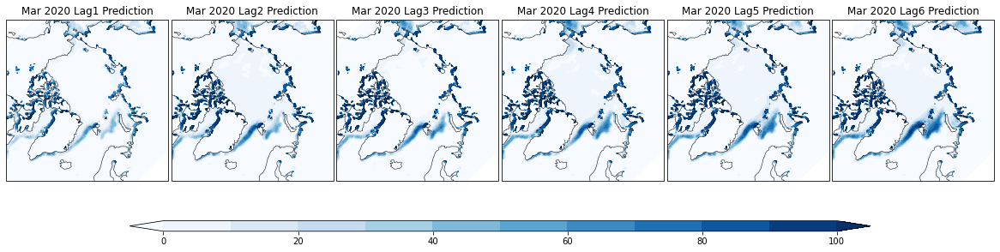

In [14]:
nrows=1
ncols=6


# Define the contour levels to use in plt.contourf
clevs=np.arange(0,110,10)

# Define the figure and each axis for the 3 rows and 3 columns
fig, axs = plt.subplots(nrows=nrows,ncols=ncols,
                        subplot_kw={'projection': ccrs.NorthPolarStereo(central_longitude=0)},
                        figsize=(20,8.5))
kw = dict(central_latitude=90, central_longitude=-45, true_scale_latitude=70)

#------------
# Contour plot
axs[0].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[0].contourf(x, y, real_ice[74]-pred_ice1[74],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[0].set_title("Mar 2020 Lag1 Prediction")

# Draw the coastines for each subplot
axs[0].coastlines(resolution='110m', linewidth=0.5)
#ax[1].gridlines()
#------------
# Contour plot
axs[1].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[1].contourf(x, y, real_ice[74]-pred_ice2[73],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[1].set_title("Mar 2020 Lag2 Prediction")

# Draw the coastines for each subplot
axs[1].coastlines(resolution='110m', linewidth=0.5)
#ax[2].gridlines()

#------------
# Contour plot
axs[2].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[2].contourf(x, y, real_ice[74]-pred_ice3[72],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[2].set_title("Mar 2020 Lag3 Prediction")

# Draw the coastines for each subplot
axs[2].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[3].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[3].contourf(x, y, real_ice[74]-pred_ice4[71],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[3].set_title("Mar 2020 Lag4 Prediction")

# Draw the coastines for each subplot
axs[3].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[4].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[4].contourf(x, y, real_ice[74]-pred_ice5[70],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[4].set_title("Mar 2020 Lag5 Prediction")

# Draw the coastines for each subplot
axs[4].coastlines(resolution='110m', linewidth=0.5)

#-------------
# Contour plot
axs[5].set_extent([-180, 180, 60, 90], crs=ccrs.PlateCarree())
cs=axs[5].contourf(x, y, real_ice[74]-pred_ice6[69],clevs,
                          transform = ccrs.Stereographic(**kw),
                          cmap=plt.cm.Blues,extend='both')

# Title each subplot with the name of the model
axs[5].set_title("Mar 2020 Lag6 Prediction")

# Draw the coastines for each subplot
axs[5].coastlines(resolution='110m', linewidth=0.5)

#-------------

# Adjust the location of the subplots on the page to make room for the colorbar
fig.subplots_adjust(bottom=0.1, top=0.8, left=0.1, right=0.9,
                    wspace=0.02, hspace=0.02)

# Add a colorbar axis at the bottom of the graph
cbar_ax = fig.add_axes([0.2, 0.2, 0.6, 0.02])

# Draw the colorbar
cbar=fig.colorbar(cs, cax=cbar_ax,orientation='horizontal')
plt.savefig("Plots/MT-IceNet 2020 Winter Difference",dpi = 400)
# Add a big title at the top
#plt.suptitle('2020 NSIDC Observations vs MT-IceNet Forecasts')